<a href="https://colab.research.google.com/github/Raian-Rahman/DIP-2021-Tasks/blob/main/DIP_Lab02_170041014.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#Task Description:

1. Implement transformation functions 
  * Log Transformation:  
  $$s = c*log(1+r)$$
  * Power-Law Transformation: 
  $$s = c*r^\gamma $$ 
2. Implement Histogram equilization algorithm
  * Global Histogram equilization
  * Local Histogram equilization


## Loading the image
In this section we will load the images for our experiment. We will use ```wget``` function to download the images hosted in google drive. To download an image from google drive, we need the file unique id.

In [ ]:
!pip install wget
import zipfile
import wget
import os
from IPython.display import clear_output


url = 'http://www.imageprocessingplace.com/downloads_V3/dip3e_downloads/dip3e_book_images/DIP3E_CH03_Original_Images.zip'

if not os.path.exists('CH03IMG.zip'):
    CH_03_img_zip = wget.download(url, out = 'CH03IMG.zip') 
    zip = zipfile.ZipFile(CH_03_img_zip)
    zip.extractall()


img_path = ['/content/DIP3E_Original_Images_CH03/'+path for path in os.listdir('/content/DIP3E_Original_Images_CH03') if path.endswith('.tif')]
clear_output()

### Loading the libraries
For this task we will use PIL library to load the image and then convert it into a numpy array. So, we will need PIL and numpy

In [ ]:
# Requred library
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt

### Loading all images
In this section we will load all the images and display that. Here, we used matplotlib subplot to show all the images in a single image.

In [ ]:
gray_scale_img = []

for path in img_path:
    img = Image.open(path)
    gray_scale_img.append(img)

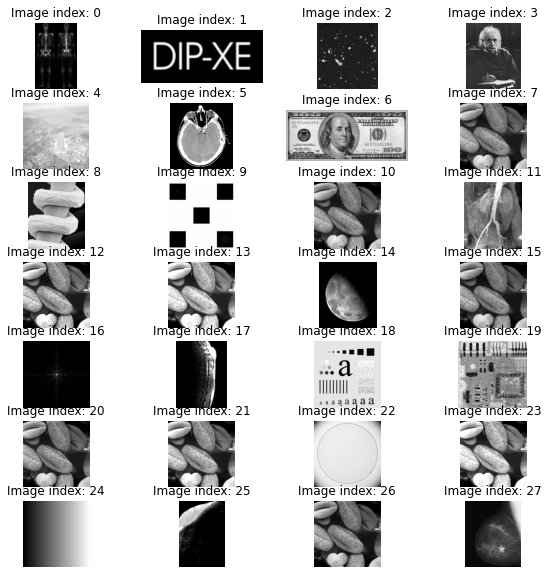

In [ ]:
fig = plt.figure(figsize = (10,10))
index = 1
for img in gray_scale_img:
    fig.add_subplot(7,4,index)
    plt.imshow(img, cmap ='gray')
    plt.axis('off')
    plt.title(f'Image index: {index - 1}')
    index += 1

#Task #1: Transformation functions





###Log Transformation: 
In this section we will implement the transformation function. The equation for implementing the function is:
$$ S = C*log(1+R) $$


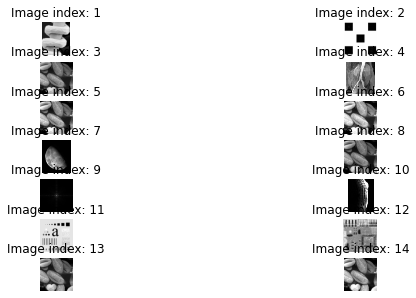

In [ ]:
"""
First we will choose the image, in this case we are selecting 8 images
Then the images are displayed
"""
chosen_img = [gray_scale_img[x] for x in range(8,22)]

fig = plt.figure(figsize = (10,10))
index = 1

for img in chosen_img:
    fig.add_subplot(len(chosen_img)+1/2,2,index)
    plt.imshow(img, cmap ='gray')
    plt.axis('off')
    plt.title('Image index: '+str(index))
    index += 1

In [ ]:
"""
This cell implements the log_transformation funtion. 
---
Parameter Description:
factor: an integer showing the factor by which we are implementing the transformation
img: the image object on which we will perform the operation
"""
def log_transformation( factor, img):
    intensity_matrix = np.array(img,dtype='uint16')
    transformed_matrix = factor*np.log(intensity_matrix+1)
    min_intensity = transformed_matrix.min()
    max_intensity = transformed_matrix.max()
    scaled = 255*(transformed_matrix-min_intensity)/(max_intensity-min_intensity)
    scaled = np.round(scaled).astype('uint8')
    return scaled

Now we will run the cell with factor values  of $0.33$, $0.66$ and $1$

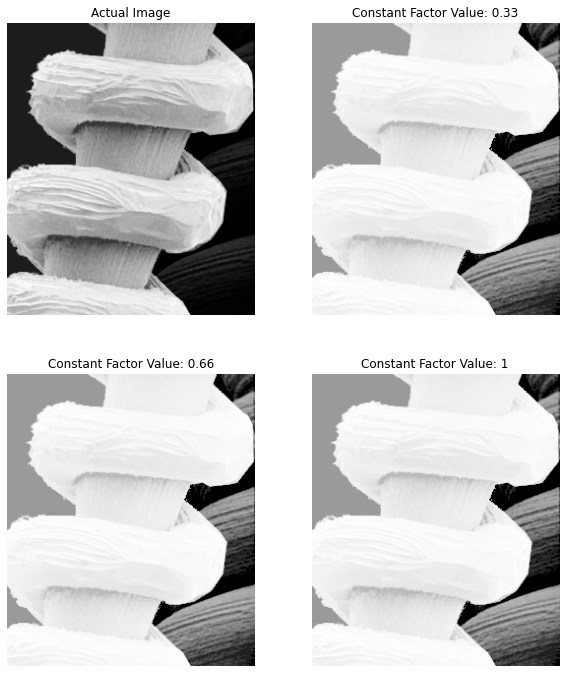

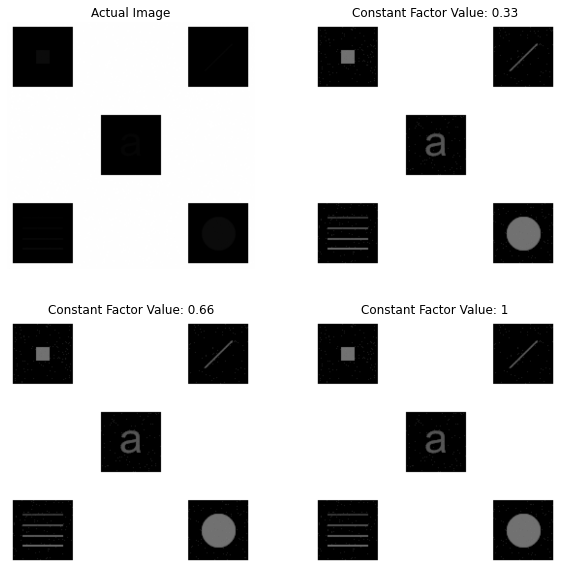

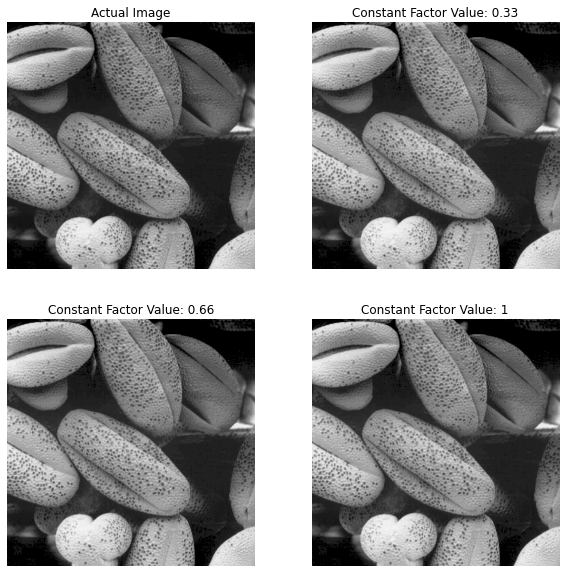

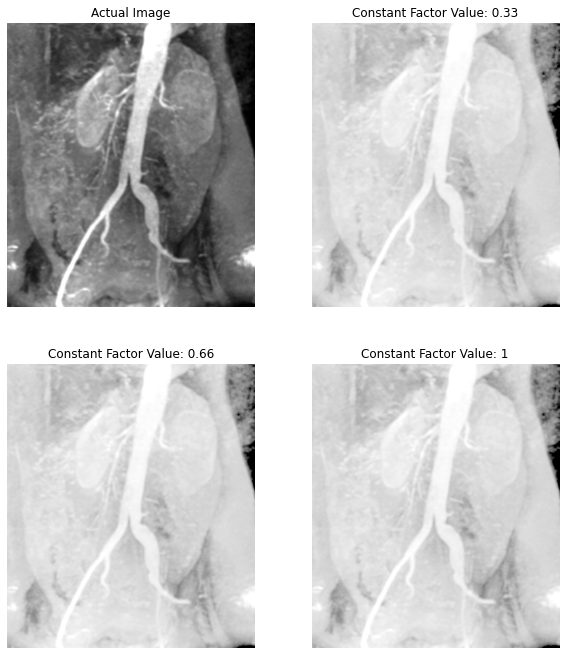

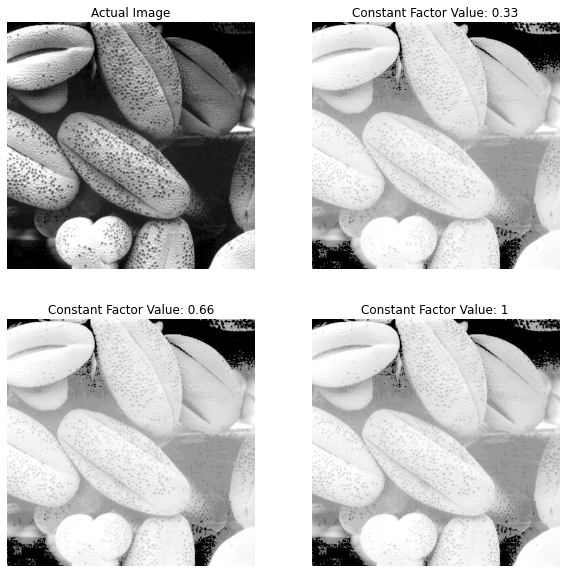

...

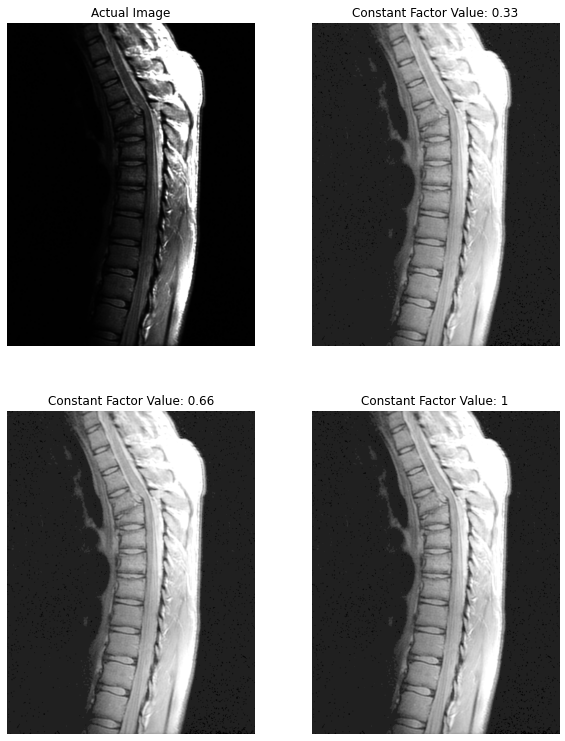

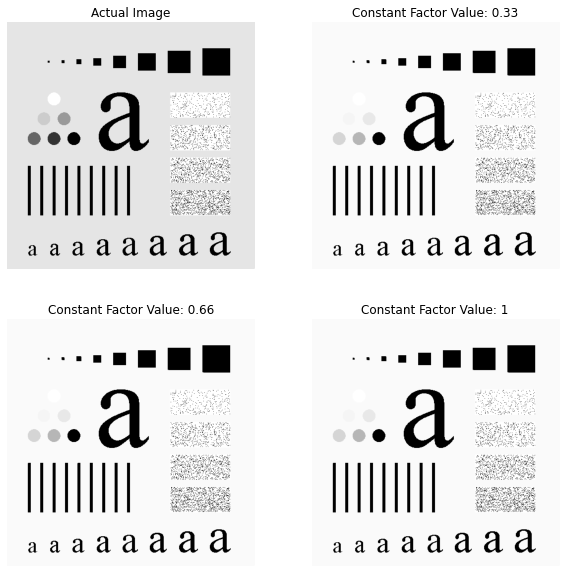

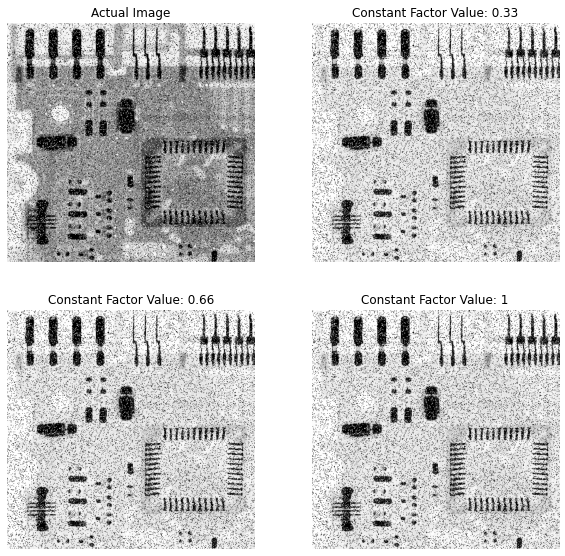

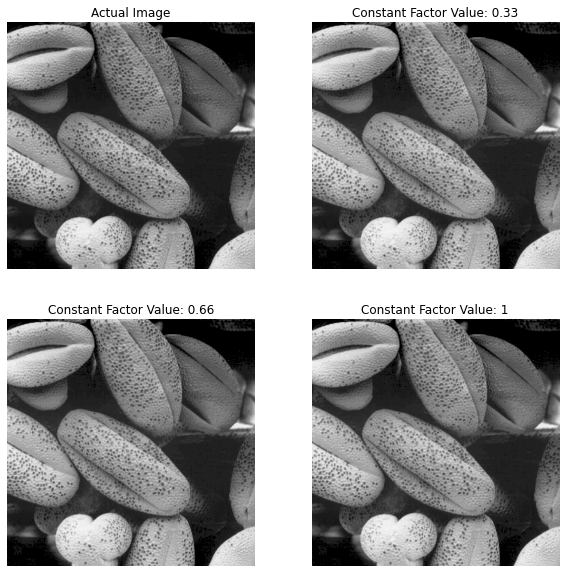

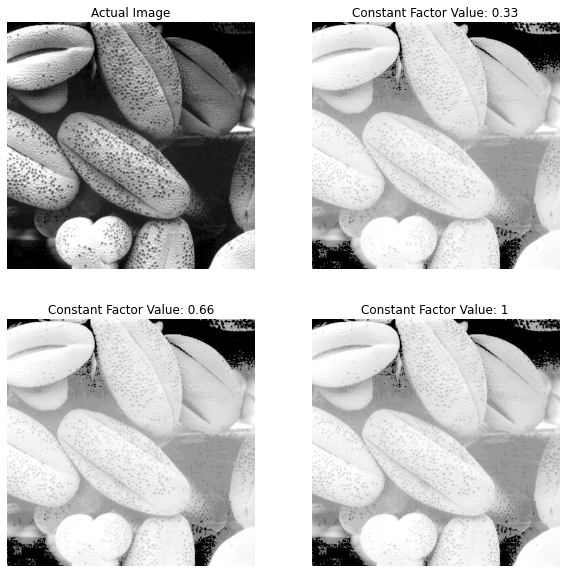

In [ ]:
factors = [0.33,0.66,1]

for img in chosen_img:
    fig = plt.figure(figsize = (10,10*(img.size[1]/img.size[0])))
    fig.add_subplot(2,2,1)

    plt.imshow(img,cmap='gray')
    plt.axis('off')
    plt.title('Actual Image')

    index=2

    for x in factors:
        fig.add_subplot(2,2,index)
        plt.imshow(log_transformation(x,img),cmap='gray')
        plt.axis('off')
        plt.title(f'Constant Factor Value: {x}')
        index += 1

###Power Law Transformation: $$S = C*R^\gamma $$

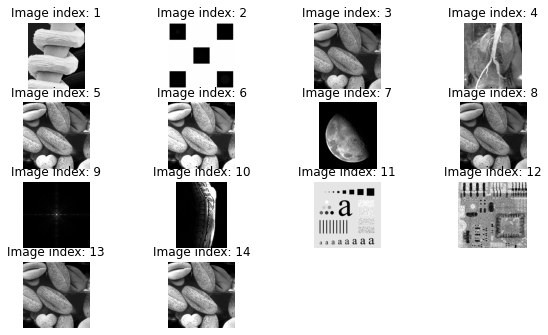

In [ ]:
#Image Selection
chosen_img = [gray_scale_img[x] for x in range(8,22)]

fig = plt.figure(figsize = (10,10))
index = 1
for img in chosen_img:
    fig.add_subplot(7,4,index)
    plt.imshow(img, cmap ='gray')
    plt.axis('off')
    plt.title(f'Image index: {index}')
    index+=1

In [ ]:
"""
This cell implements the power law funtion. 
---
Parameter Description:
factor: an integer showing the factor by which we are implementing the transformation
gamma: the value of gamman for the operation
img: the image object on which we will perform the operation
"""
def power_law(factor, gamma, img):
    intensity_matrix = np.array(img,dtype='uint16')
    transformed_matrix = factor*np.power(intensity_matrix,gamma)
    
    min_intensity = transformed_matrix.min()
    max_intensity = transformed_matrix.max()

    scaled = 255*(transformed_matrix-min_intensity)/(max_intensity-min_intensity)
    scaled = np.round(scaled).astype('uint8')
    return scaled

Now. we will run the cell for different values of gamma

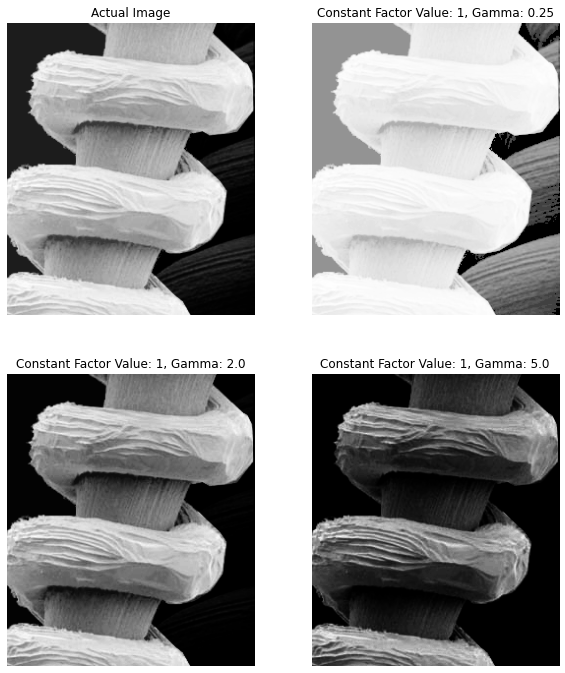

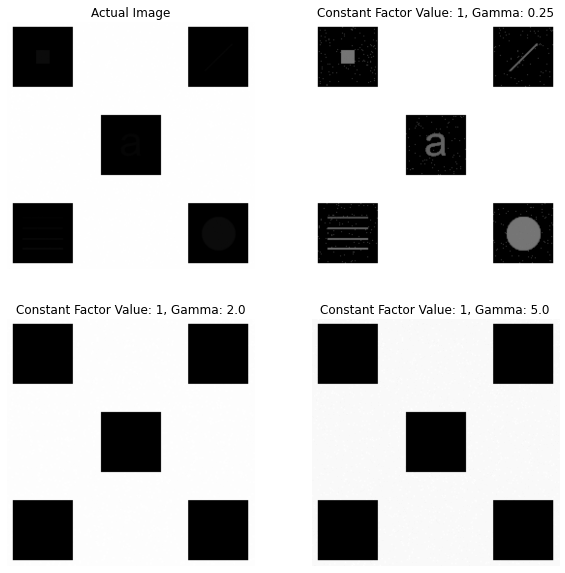

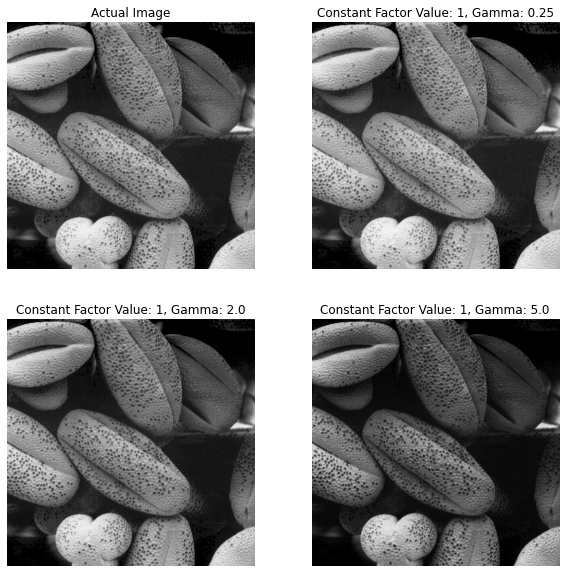

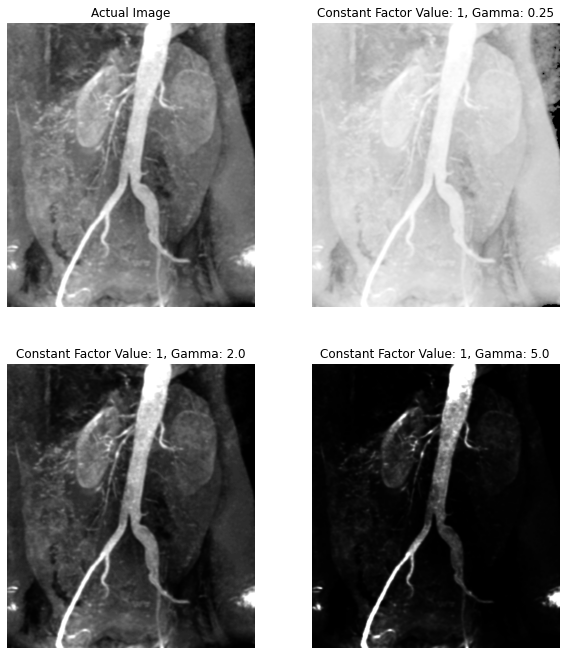

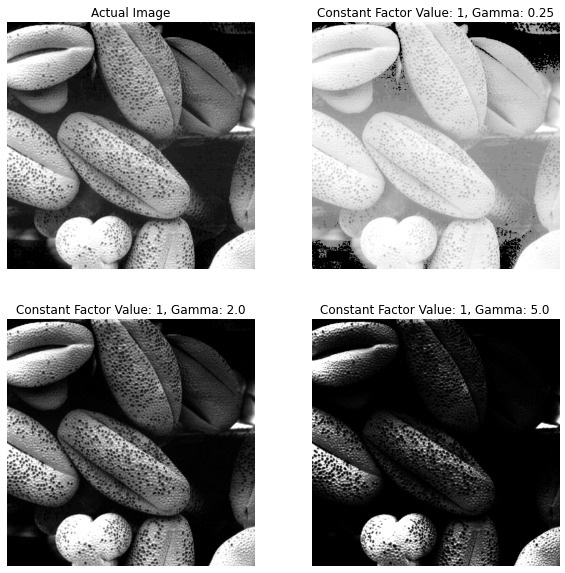

...

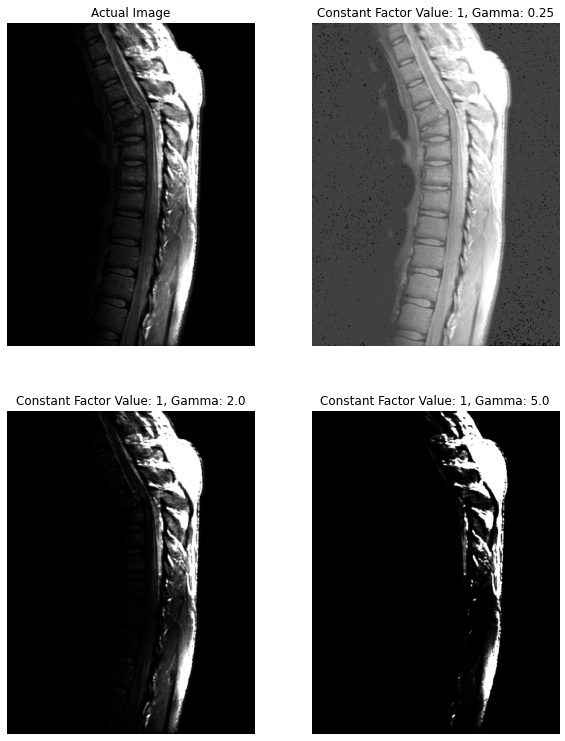

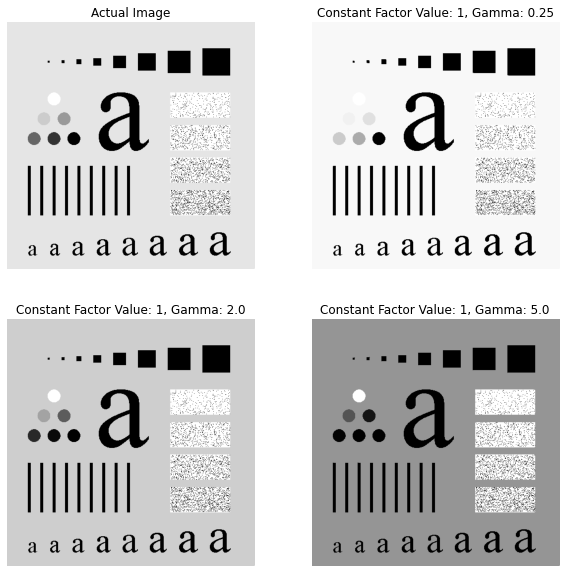

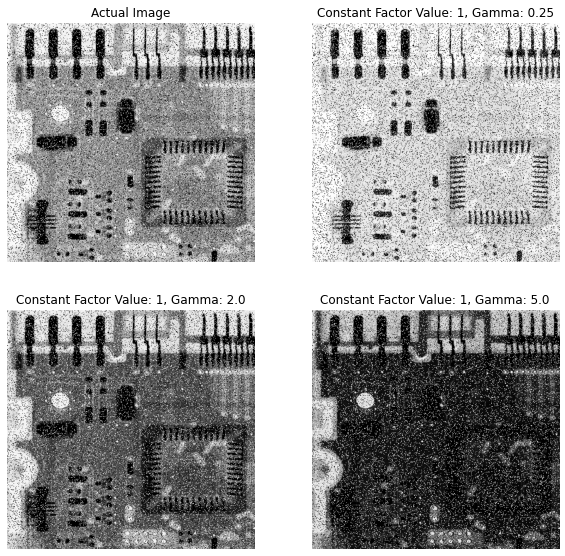

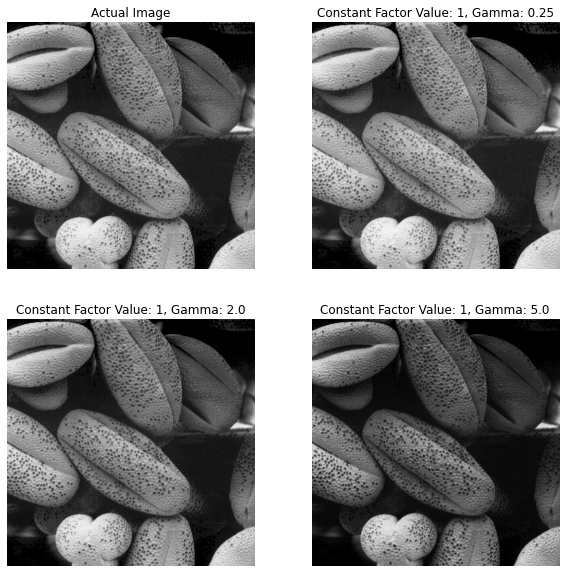

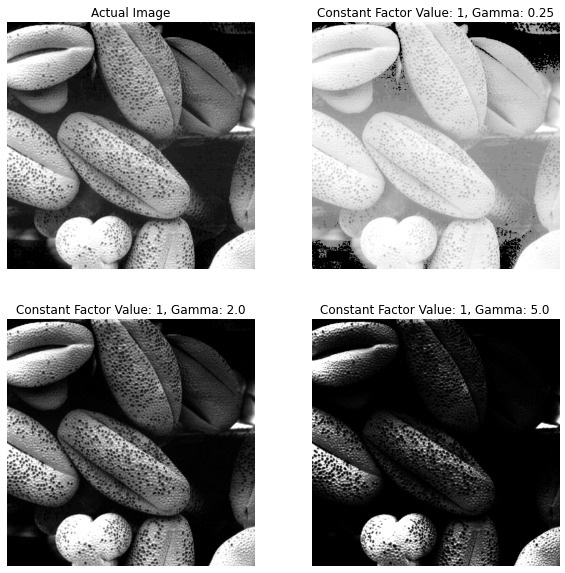

In [ ]:
factors = 1
gamma = [0.25,2.0,5.0]

for img in chosen_img:
  fig = plt.figure(figsize = (10,10*(img.size[1]/img.size[0])))
  fig.add_subplot(2,2,1)
  plt.imshow(img,cmap='gray')
  plt.axis('off')
  plt.title('Actual Image')
  index=2
  for x in gamma:
    fig.add_subplot(2,2,index)
    plt.imshow(power_law(1,x,img),cmap='gray')
    plt.axis('off')
    plt.title(f'Constant Factor Value: 1, Gamma: {x}')
    index += 1

## Discussion

### Log VS Power-Law:
Log Transformation is suitable only for images that has more dark pixels. It can only increase the brightness. So, comparativly low intensity images are suitable for increasing intensity


Power-Law Transformation is suitable for all kind of images. This transformation has the flexibility to both darken and whiten the image. So it can work as Log transformation as well as other lowering intensity function.

###Needs of scaling before displaying:
Because of transformation, the intesity values crosses the range [0,255]. So we need to scale them in range[0,255] for 8bit image display.


Another thing worth mentioning, the constant factor C doesn't have effect on output, if we scale the image.

. \\
. \\
. \\
. \\
. \\
. \\
. \\
. \\
. \\
. \\
. \\
. \\
. \\


# Task #2: Histogram Equilization


In [ ]:
def get_frequency_count(img):
    intensity_matrix = np.array(img)
    color, frequency = np.unique(intensity_matrix,return_counts=True)
    histogram = np.full(256,0,'uint64')
    histogram[color]=frequency
    return histogram

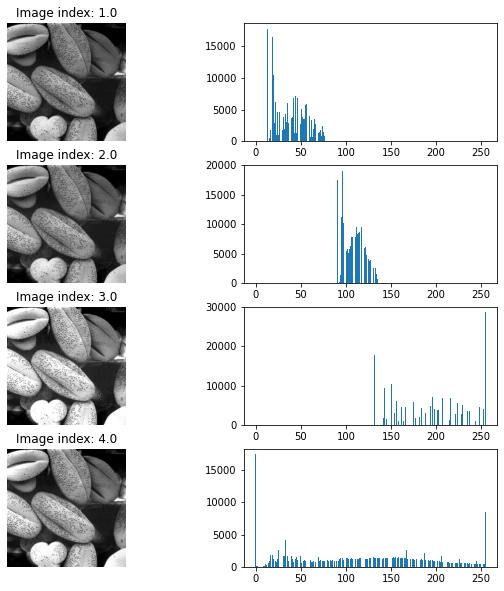

In [ ]:
chosen_img=[gray_scale_img[x] for x in [15,20,23,12]]

fig = plt.figure(figsize = (10,10))
index = 1
for img in chosen_img:
    fig.add_subplot(len(chosen_img),2,index)
    plt.imshow(img, cmap ='gray')
    plt.axis('off')
    plt.title(f'Image index: {index/2+0.5}')
    fig.add_subplot(len(chosen_img),2,index+1)
    plt.bar(range(0,256),get_frequency_count(img))
    index += 2

### Global Histogram Equalization

In [ ]:
"""
This cell implements the Histogram equalization. 
---
Parameter Description:
img: the image object on which we will perform the operation
"""
def histogram_equalization(img):
  histogram = get_frequency_count(img)
  cumHistogram = np.cumsum(histogram)
  totalPixelCount = np.sum(histogram)
  CDF = cumHistogram/totalPixelCount
  scaled = np.round(255*CDF).astype('uint8')
  img=scaled[img]
  return img

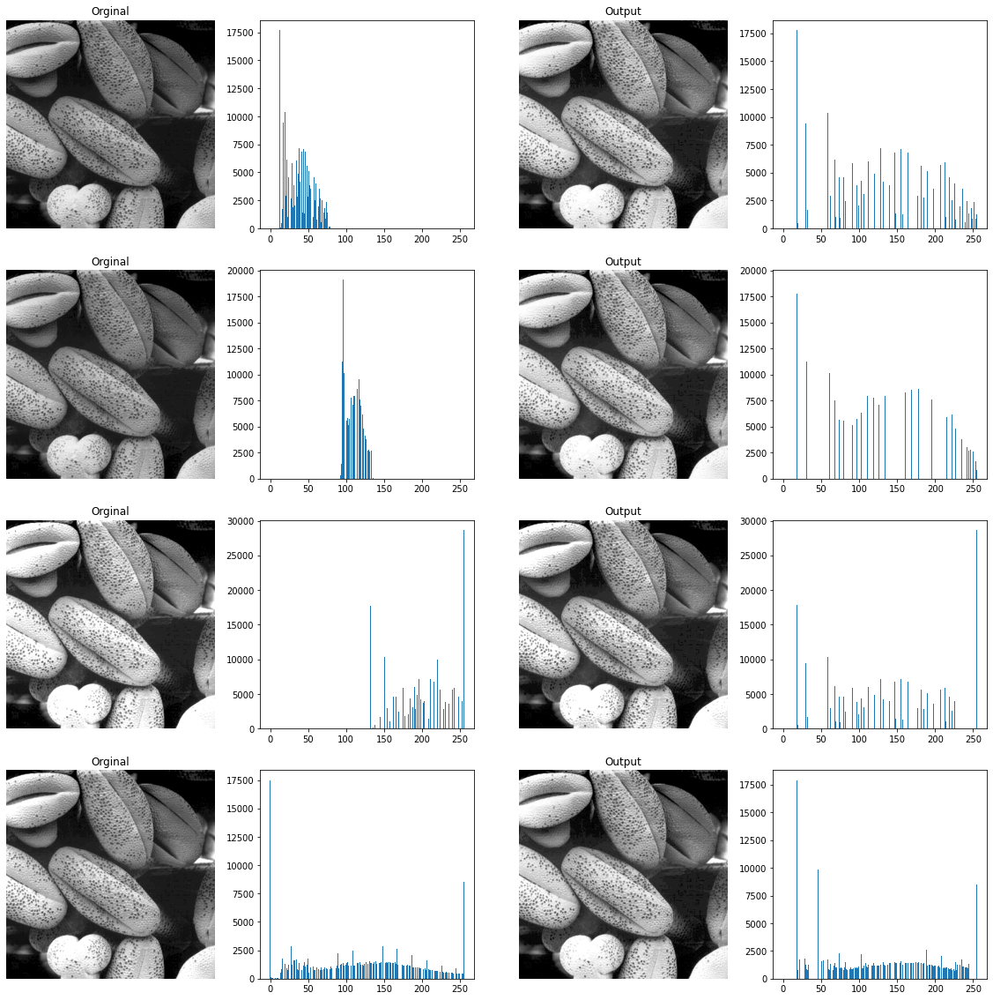

In [ ]:
fig = plt.figure(figsize = (20,20))
index = 1
for img in chosen_img:
    fig.add_subplot(len(chosen_img),4,index)
    plt.imshow(img, cmap ='gray')
    plt.axis('off')
    plt.title('Orginal')
    fig.add_subplot(len(chosen_img),4,index+1)
    plt.bar(range(0,256),get_frequency_count(img))
    fig.add_subplot(len(chosen_img),4,index+2)
    img = histogram_equalization(img)
    plt.imshow(img,cmap= 'gray')
    plt.axis('off')
    plt.title('Output')
    fig.add_subplot(len(chosen_img),4,index+3)
    plt.bar(range(0,256),get_frequency_count(img))
    index+=4

###Effect of repeative Histogram Equalization

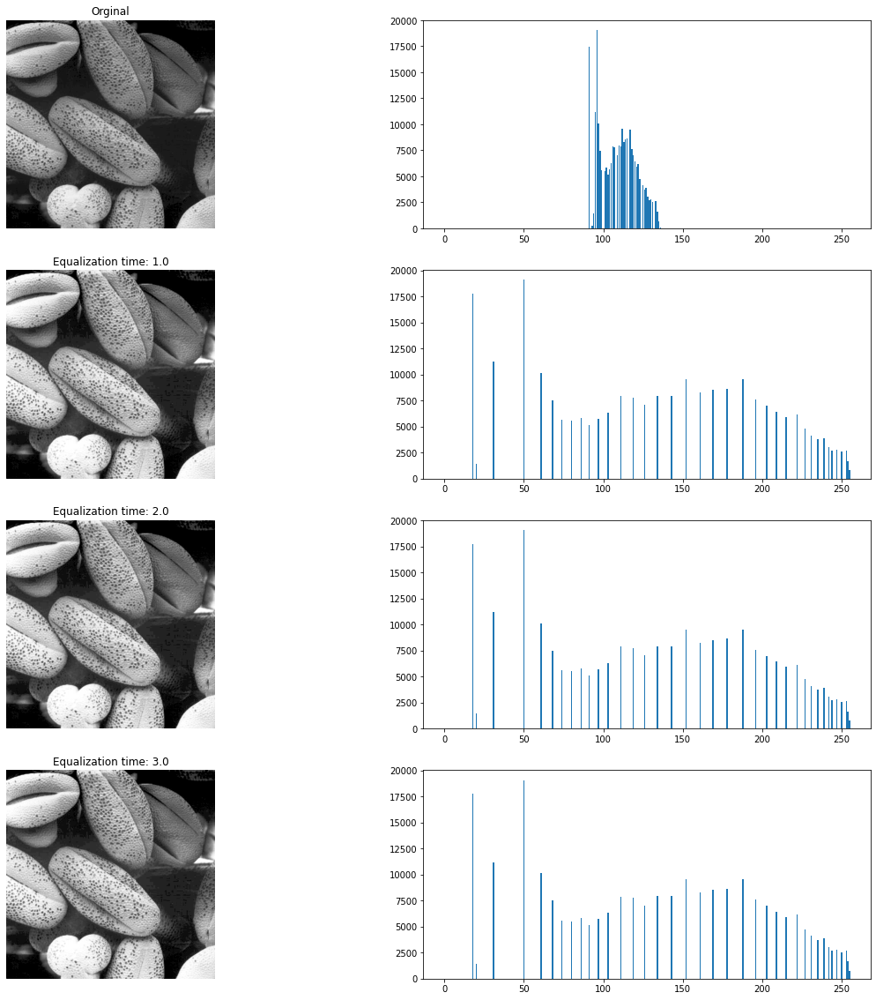

In [ ]:
img = gray_scale_img[20]

index = 1
fig = plt.figure(figsize = (20,20))
fig.add_subplot(4,2,index)
plt.imshow(img, cmap ='gray')
plt.axis('off')
plt.title('Orginal')
fig.add_subplot(4,2,index+1)
plt.bar(range(0,256),get_frequency_count(img))

index+=2
for x in range(0,3):
  fig.add_subplot(4,2,index)
  img = histogram_equalization(img)
  plt.imshow(img, cmap ='gray')
  plt.axis('off')
  plt.title(f'Equalization time: {(index-1)/2}')
  fig.add_subplot(len(chosen_img),2,index+1)
  plt.bar(range(0,256),get_frequency_count(img))
  index+=2

### Local Histogram Equalization

In [ ]:
"""
This cell implements the local histogram equalization. 
---
Parameter Description:
local_dim: the dimension along which we will perform the operation
img: the image object on which we will perform the operation
"""
def local_histogram_equalization(local_dim, img):
    intensity_matrix = np.array(img)
    local_w, local_h = local_dim
    w , h = img.size
    for x in range(0,w,local_w):
        for y in range(0,h,local_h):
            intensity_matrix[x:min(w,local_w+x),y:min(h,local_h+y)]=histogram_equalization(Image.fromarray(intensity_matrix[x:min(w,local_w+x),y:min(h,local_h+y)]))
    return Image.fromarray(intensity_matrix)

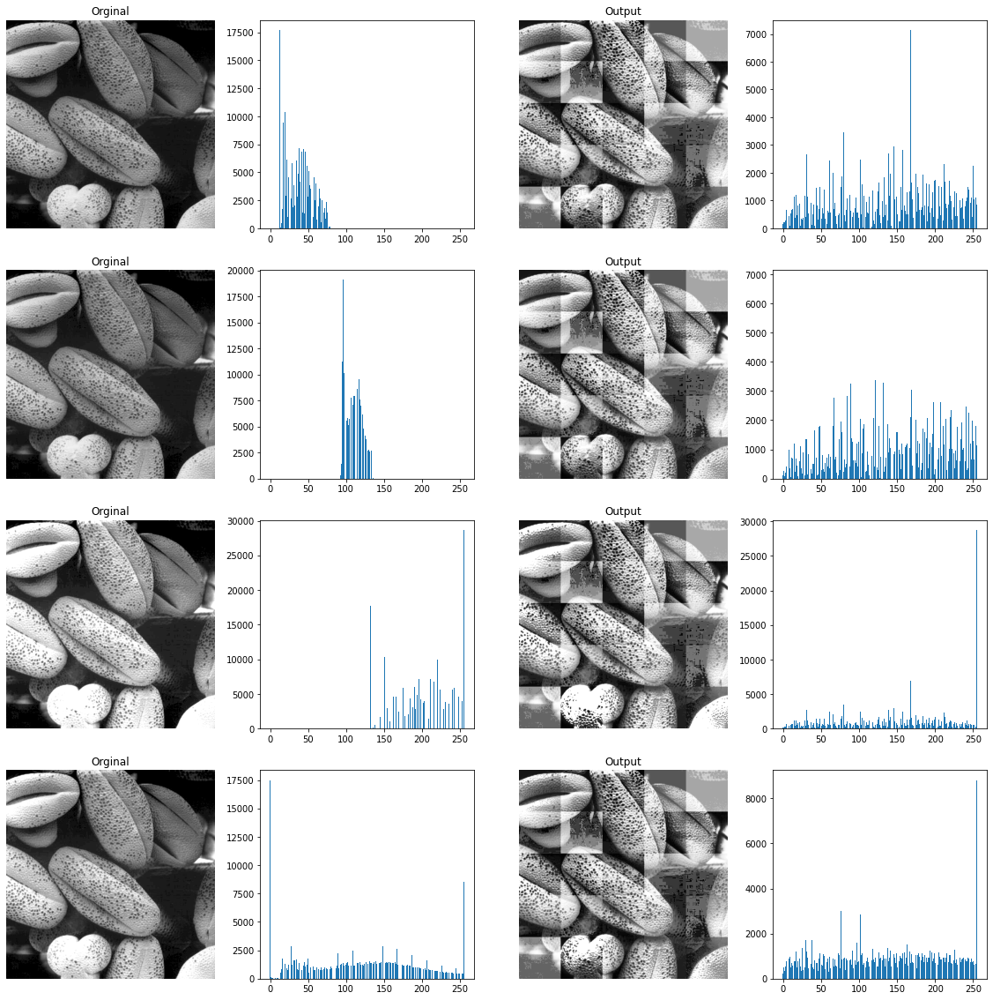

In [ ]:
fig = plt.figure(figsize = (20,20))
index = 1
for img in chosen_img:
    fig.add_subplot(len(chosen_img),4,index)
    plt.imshow(img, cmap ='gray')
    plt.axis('off')
    plt.title('Orginal')
    fig.add_subplot(len(chosen_img),4,index+1)
    plt.bar(range(0,256),get_frequency_count(img))
    fig.add_subplot(len(chosen_img),4,index+2)
    
    img = local_histogram_equalization((100,100),img) 
    plt.imshow(img,cmap= 'gray')
    plt.axis('off')
    plt.title('Output')
    fig.add_subplot(len(chosen_img),4,index+3)
    plt.bar(range(0,256),get_frequency_count(img))
    
    index+=4

## Discussion

###**No effect of repeative histogram equalizatioin**: 

If we see the algorithm of more intuitively, we will found that the intensity values are not responsible for change in PDF or CDF. PDF and CDF are only dependent of the frequencies of the unique intensity values. On first histogram the unique intensities are mapped with more spaced intensities but the unique intensity frequencies are remained same. As a result next histogram euqalization produced same kind of mapping which became identical. 

That's why repeative histogram doesn't produce further improvment

###**Annoying Side Effect at boundary of local image region:**

Each sub-region's intensities are equalized on the scale of [0,255]. As result, you can see the very dark regions became whiter. But all the dark regions doesn't have same kind of intensity distribution. That's why each region whitened unequally resulting annoying side effect at boundary regions. Gradual changes cannot be detected by eyes, but at those bounday region we have pretty much large jumps in actual intensity. So they are caught by eyes.

## Author
--------------------------------------
Raian Rahman \\
Student ID: 170041014 \\
Dept. of Computer Science and Engineering \\
Islamic Unviersity of Technology \\
Gazipur, Bangladesh.
